In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')

<h1>Load Data </h1>
<p> Analyzing the data</p>

In [4]:
df_tennis=pd.read_csv('../data/atp_matches_2023.csv')
df_tennis.head()

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,...,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
0,2023-9900,United Cup,Hard,18,A,20230102,300,126203,3.0,NaN,...,62.0,47.0,15.0,12.0,9.0,9.0,9.0,3355.0,16.0,2375.0
1,2023-9900,United Cup,Hard,18,A,20230102,299,126207,NaN,NaN,...,12.0,8.0,3.0,4.0,1.0,3.0,19.0,2000.0,23.0,1865.0
2,2023-9900,United Cup,Hard,18,A,20230102,296,126203,3.0,NaN,...,62.0,51.0,7.0,12.0,2.0,2.0,9.0,3355.0,10.0,2905.0
3,2023-9900,United Cup,Hard,18,A,20230102,295,126207,NaN,NaN,...,41.0,26.0,12.0,9.0,6.0,9.0,19.0,2000.0,245.0,220.0
4,2023-9900,United Cup,Hard,18,A,20230102,292,126774,1.0,NaN,...,58.0,48.0,18.0,16.0,1.0,2.0,4.0,5550.0,16.0,2375.0


In [11]:
result=df_tennis[df_tennis['winner_name']=='Carlos Alcaraz']
print(result)

     tourney_id      tourney_name surface  draw_size tourney_level  \
395   2023-0506      Buenos Aires    Clay         32             A   
396   2023-0506      Buenos Aires    Clay         32             A   
398   2023-0506      Buenos Aires    Clay         32             A   
402   2023-0506      Buenos Aires    Clay         32             A   
481   2023-6932    Rio De Janeiro    Clay         32             A   
...         ...               ...     ...        ...           ...   
2369  2023-0747           Beijing    Hard         32             A   
2400  2023-5014  Shanghai Masters    Hard        128             M   
2416  2023-5014  Shanghai Masters    Hard        128             M   
2745  2023-0605       Tour Finals    Hard          8             A   
2746  2023-0605       Tour Finals    Hard          8             A   

      tourney_date  match_num  winner_id  winner_seed winner_entry  ...  \
395       20230213        300     207989          1.0          NaN  ...   
396      

<h2>Creating a table visualization for all matches per tournament </h2>

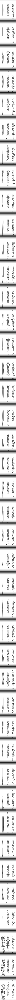

In [12]:
match_outcomes=df_tennis[['tourney_name', 'winner_name', 'loser_name']].copy() #copying the dataframe

fig, ax=plt.subplots(figsize=(10, 6))
ax.axis('off') #hiding the axis

table_data=[] #creating a list to store the table data

for _, row in match_outcomes.iterrows(): #use _ to ignore the index. 
    table_data.append([row['tourney_name'], row['winner_name'], row['loser_name']]) #appending the data to the list

table=ax.table(cellText=table_data, colLabels=match_outcomes.columns, loc='center', cellLoc='center') #creating the table

table.auto_set_font_size(False) #setting the font size
table.set_fontsize(10) #setting the font size
plt.title("Individual Match Outcomes", fontsize=15) #setting the title
plt.show() #showing the plot

In [13]:
df_tennis.columns

Index(['tourney_id', 'tourney_name', 'surface', 'draw_size', 'tourney_level',
       'tourney_date', 'match_num', 'winner_id', 'winner_seed', 'winner_entry',
       'winner_name', 'winner_hand', 'winner_ht', 'winner_ioc', 'winner_age',
       'loser_id', 'loser_seed', 'loser_entry', 'loser_name', 'loser_hand',
       'loser_ht', 'loser_ioc', 'loser_age', 'score', 'best_of', 'round',
       'minutes', 'w_ace', 'w_df', 'w_svpt', 'w_1stIn', 'w_1stWon', 'w_2ndWon',
       'w_SvGms', 'w_bpSaved', 'w_bpFaced', 'l_ace', 'l_df', 'l_svpt',
       'l_1stIn', 'l_1stWon', 'l_2ndWon', 'l_SvGms', 'l_bpSaved', 'l_bpFaced',
       'winner_rank', 'winner_rank_points', 'loser_rank', 'loser_rank_points'],
      dtype='object')

<h2> Let's explore all the stats of Wimbledon 2023 final </h2>

In [19]:
wimbledon_final=df_tennis[(df_tennis['tourney_name']=='Wimbledon') &(df_tennis['winner_name']=="Carlos Alcaraz") &(df_tennis['round']=='F')].copy()
print(wimbledon_final)

# use values[0] to extract the value from the dataframe which print the value in the first row
match_score=wimbledon_final['score'].values[0]
winner_name=wimbledon_final['winner_name'].values[0]
print(f"The score of the final was: {match_score} and the winner was: {winner_name}")   

     tourney_id tourney_name surface  draw_size tourney_level  tourney_date  \
1721   2023-540    Wimbledon   Grass        128             G      20230703   

      match_num  winner_id  winner_seed winner_entry  ... l_1stIn l_1stWon  \
1721        226     207989          1.0          NaN  ...   118.0     73.0   

      l_2ndWon l_SvGms  l_bpSaved  l_bpFaced  winner_rank winner_rank_points  \
1721      37.0    24.0       14.0       19.0          1.0             7675.0   

     loser_rank loser_rank_points  
1721        2.0            7595.0  

[1 rows x 49 columns]
The score of the final was: 1-6 7-6(6) 6-1 3-6 6-4 and the winner was: Carlos Alcaraz


<h2>Data types </h2>

In [21]:
df_tennis.dtypes

tourney_id             object
tourney_name           object
surface                object
draw_size               int64
tourney_level          object
tourney_date            int64
match_num               int64
winner_id               int64
winner_seed           float64
winner_entry           object
winner_name            object
winner_hand            object
winner_ht             float64
winner_ioc             object
winner_age            float64
loser_id                int64
loser_seed            float64
loser_entry            object
loser_name             object
loser_hand             object
loser_ht              float64
loser_ioc              object
loser_age             float64
score                  object
best_of                 int64
round                  object
minutes               float64
w_ace                 float64
w_df                  float64
w_svpt                float64
w_1stIn               float64
w_1stWon              float64
w_2ndWon              float64
w_SvGms   

<h2>Checking missing values</h>

In [22]:
df_tennis.isna().sum()

tourney_id               0
tourney_name             0
surface                  0
draw_size                0
tourney_level            0
tourney_date             0
match_num                0
winner_id                0
winner_seed           1721
winner_entry          2483
winner_name              0
winner_hand              0
winner_ht              200
winner_ioc               0
winner_age               2
loser_id                 0
loser_seed            2202
loser_entry           2261
loser_name               0
loser_hand               0
loser_ht               328
loser_ioc                0
loser_age               10
score                    2
best_of                  0
round                    0
minutes                344
w_ace                  226
w_df                   226
w_svpt                 226
w_1stIn                226
w_1stWon               226
w_2ndWon               226
w_SvGms                226
w_bpSaved              226
w_bpFaced              226
l_ace                  226
l

<h2> Finding missing values </h2>

In [24]:
df_tennis.isna().sum()

tourney_id               0
tourney_name             0
surface                  0
draw_size                0
tourney_level            0
tourney_date             0
match_num                0
winner_id                0
winner_seed           1721
winner_entry          2483
winner_name              0
winner_hand              0
winner_ht              200
winner_ioc               0
winner_age               2
loser_id                 0
loser_seed            2202
loser_entry           2261
loser_name               0
loser_hand               0
loser_ht               328
loser_ioc                0
loser_age               10
score                    2
best_of                  0
round                    0
minutes                344
w_ace                  226
w_df                   226
w_svpt                 226
w_1stIn                226
w_1stWon               226
w_2ndWon               226
w_SvGms                226
w_bpSaved              226
w_bpFaced              226
l_ace                  226
l

In [47]:
#checking the not null values in the winner entry column becuase it has a lot of null values
print(df_tennis[df_tennis[['winner_entry']].notnull().all(1)])


     tourney_id tourney_name surface  draw_size tourney_level  tourney_date  \
62    2023-2843   Adelaide 1    Hard         32             A      20230102   
65    2023-2843   Adelaide 1    Hard         32             A      20230102   
72    2023-2843   Adelaide 1    Hard         32             A      20230102   
78    2023-2843   Adelaide 1    Hard         32             A      20230102   
92    2023-0891         Pune    Hard         32             A      20230102   
...         ...          ...     ...        ...           ...           ...   
2703  2023-0341         Metz    Hard         32             A      20231106   
2708  2023-0341         Metz    Hard         32             A      20231106   
2717  2023-7434        Sofia    Hard         32             A      20231106   
2725  2023-7434        Sofia    Hard         32             A      20231106   
2727  2023-7434        Sofia    Hard         32             A      20231106   

      match_num  winner_id  winner_seed winner_entr

<p>The null values in columns such as winner_entry, winner_seed, loser_entry and loser_seed,are not important at all</p>

<h2>let's impute other columns that has null values that are important such as the winner_rank and loser_rank </h2>

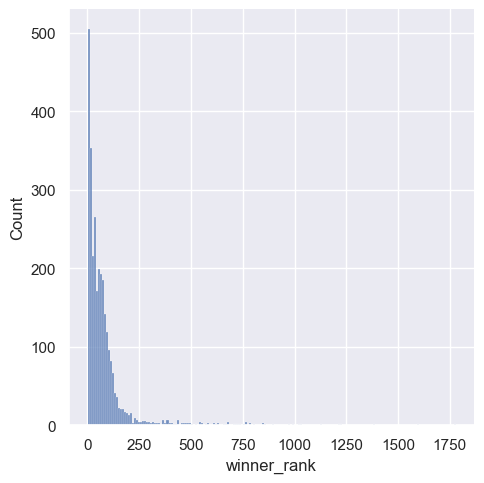

In [44]:
#checking the distribution plot of the winner rank to decided with imputation method to use
sns.displot(df_tennis['winner_rank'])


In [45]:
df_tennis['winner_rank'].fillna(df_tennis['winner_rank'].median(), inplace=True)
df_tennis['loser_rank'].fillna(df_tennis['loser_rank'].median(), inplace=True)

<h2>let's impute other columns that has null values that are important such as the winner_ht (winner height) and loser_ht(loser height) </h2>

<p>This is column is going to take into account for the model </p>

<Axes: xlabel='winner_ht'>

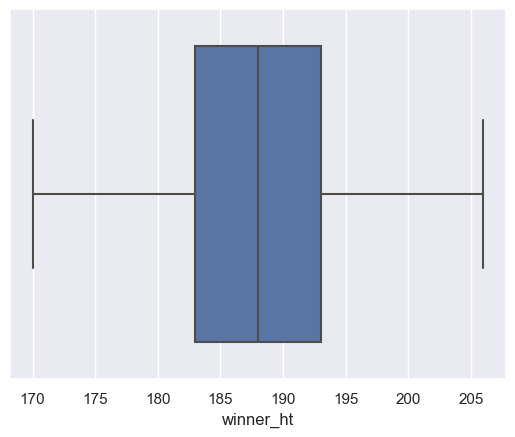

In [50]:
sns.boxplot(x=df_tennis['winner_ht'])


In [51]:
#we are going to fill the null values with the mean because the distribution is not skewed

df_tennis['winner_ht'].fillna(df_tennis['winner_ht'].mean(), inplace=True)
df_tennis['loser_ht'].fillna(df_tennis['loser_ht'].mean(), inplace=True)

<h2>let's impute other columns that has null values that are important such as the winner_age and loser_age </h2>

<p>This is column is going to take into account for the model </p>

<Axes: xlabel='winner_age'>

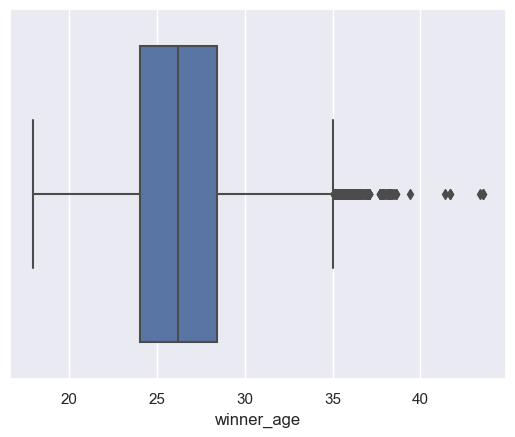

In [53]:
sns.boxplot(x=df_tennis['winner_age'])

<Axes: xlabel='loser_age'>

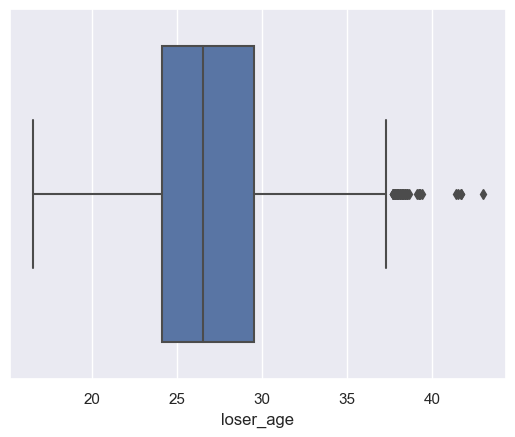

In [54]:
sns.boxplot(x=df_tennis['loser_age'])

In [55]:
#we are going to fill the null values with the meadian because the distribution is skewed
df_tennis['winner_age'].fillna(df_tennis['winner_age'].median(), inplace=True)
df_tennis['loser_age'].fillna(df_tennis['loser_age'].median(), inplace=True)

<h2> Let's drop some columns that won't contribute to the model </h2>

In [59]:
columns_to_drop=['winner_entry', 'loser_entry', 'winner_seed', 'loser_seed', 'winner_ioc', 
                    'loser_ioc', 'winner_rank_points', 'loser_rank_points']

#drop the columns
df_tennis.drop(columns_to_drop, axis=1, inplace=True)

<h2>Let's check again our missing values </h2>

In [60]:
df_tennis.isna().sum()

tourney_id         0
tourney_name       0
surface            0
draw_size          0
tourney_level      0
tourney_date       0
match_num          0
winner_id          0
winner_name        0
winner_hand        0
winner_ht          0
winner_age         0
loser_id           0
loser_name         0
loser_hand         0
loser_ht           0
loser_age          0
score              2
best_of            0
round              0
minutes          344
w_ace            226
w_df             226
w_svpt           226
w_1stIn          226
w_1stWon         226
w_2ndWon         226
w_SvGms          226
w_bpSaved        226
w_bpFaced        226
l_ace            226
l_df             226
l_svpt           226
l_1stIn          226
l_1stWon         226
l_2ndWon         226
l_SvGms          226
l_bpSaved        226
l_bpFaced        226
winner_rank        0
loser_rank         0
dtype: int64

<h2>Let's explore categorical variables </h2>

In [57]:
print(f"Unique values in SURFACE: {','.join(df_tennis['surface'].unique())}")
print(f"Unique values in Tournament level: {','.join(df_tennis['tourney_level'].unique())}")
print(f"Unique values in winner hand: {','.join(df_tennis['winner_hand'].unique())}")
print(f"Unique values in loser hand: {','.join(df_tennis['loser_hand'].unique())}")


Unique values in SURFACE: Hard,Clay,Grass,None
Unique values in Tournament level: A,G,M,D
Unique values in winner hand: R,L,U
Unique values in loser hand: R,U,L


In [62]:
# df_tennis[df_tennis['surface']=='None']
df_tennis[df_tennis['winner_hand']=='U']

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_name,winner_hand,...,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,loser_rank
13,2023-9900,United Cup,Hard,18,A,20230102,275,208852,Stefanos Sakellaridis,U,...,5.0,86.0,52.0,33.0,16.0,14.0,3.0,7.0,803.0,129.0
177,2023-580,Australian Open,Hard,128,G,20230116,117,208014,Rinky Hijikata,U,...,2.0,152.0,98.0,73.0,27.0,25.0,8.0,11.0,169.0,128.0
390,2023-0499,Delray Beach,Hard,32,A,20230213,276,123896,Matija Pecotic,U,...,6.0,92.0,45.0,30.0,19.0,13.0,6.0,11.0,784.0,143.0
566,2023-0807,Acapulco,Hard,32,A,20230227,272,202235,Jacopo Berrettini,U,...,6.0,76.0,33.0,26.0,22.0,13.0,3.0,5.0,842.0,78.0
622,2023-8996,Santiago,Clay,32,A,20230227,276,109686,Riccardo Bonadio,U,...,4.0,75.0,46.0,33.0,13.0,11.0,3.0,6.0,182.0,83.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2023-M-DC-2023-WG2-PO-EGY-PAR-01,Davis Cup WG2 PO: EGY vs PAR,None,4,D,20230203,1,209871,Amr Elsayed Abdou Ahmed Mohamed,U,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,574.0,1329.0
2938,2023-M-DC-2023-WG2-PO-ESA-JOR-01,Davis Cup WG2 PO: ESA vs JOR,None,4,D,20230203,2,207461,Mousa Alkotop,U,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1594.0,67.0
2943,2023-M-DC-2023-WG2-PO-EST-JAM-01,Davis Cup WG2 PO: EST vs JAM,None,4,D,20230204,5,200575,Johannes Seeman,U,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.0,67.0
2949,2023-M-DC-2023-WG2-PO-RSA-LUX-01,Davis Cup WG2 PO: RSA vs LUX,None,4,D,20230204,2,208210,Chris Rodesch,U,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,724.0,516.0
